In [2]:
from sklearn.cluster import AffinityPropagation
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import Birch
from sklearn.cluster import DBSCAN
from sklearn.cluster import FeatureAgglomeration
from sklearn.cluster import MeanShift
from sklearn.cluster import OPTICS
from sklearn.cluster import SpectralBiclustering, SpectralClustering, SpectralCoclustering

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage.io import imread

# **Кластеризация в задачах машинного обучения**

https://www.kaggle.com/datasets/uciml/electric-power-consumption-data-set?resource=download

https://www.kaggle.com/datasets/joonasyoon/clustering-exercises

https://www.kaggle.com/datasets/hellbuoy/online-retail-customer-clustering

https://habr.com/ru/post/322034/

https://scikit-learn.org/stable/modules/clustering.html#k-means



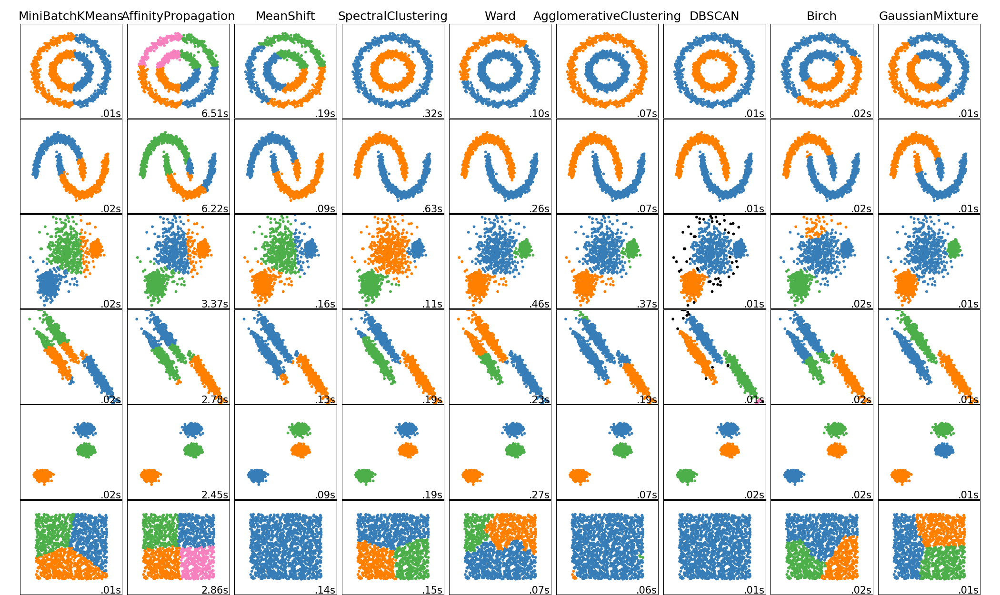

# **Принцип и методы**

Алгоритмы кластеризации работают по принципу определения наиболее похожих друг на друга записей по средним их значениям, и и объединение таких записей в группы. Задача определения наиболее похожих записей и присвоение им метки решается также и другим образом, но ключевой аспект выражается в поиске наиболее вероятных общих закономерностей между прецедентами в исходных данных задачи (строки в кадре данных, картинки в датасете компьютерного зрения, аудиозаписи в обработке звука, предложения или текст в обработке текста).

Среди алгоритмов кластеризации выделяют:

1. K-means (обычный, мини-пакетный, бисекции).
2. Affinity propagation (афинное распространение).
3. Mean-shift (средний сдвиг).
4. Spectral clustering (спектраьная кластеризация).
5. Ward hierarchical clustering (иерархическая кластеризация Ward).
6. Agglomerative clustering (агломеративная кластеризация).
7. DBSCAN (колчиество соседей).
8. OPTICS.
9. Gaussian mixture (смесь нормальных распределений).
10. BIRCH.



https://scikit-learn.org/stable/modules/clustering.html#

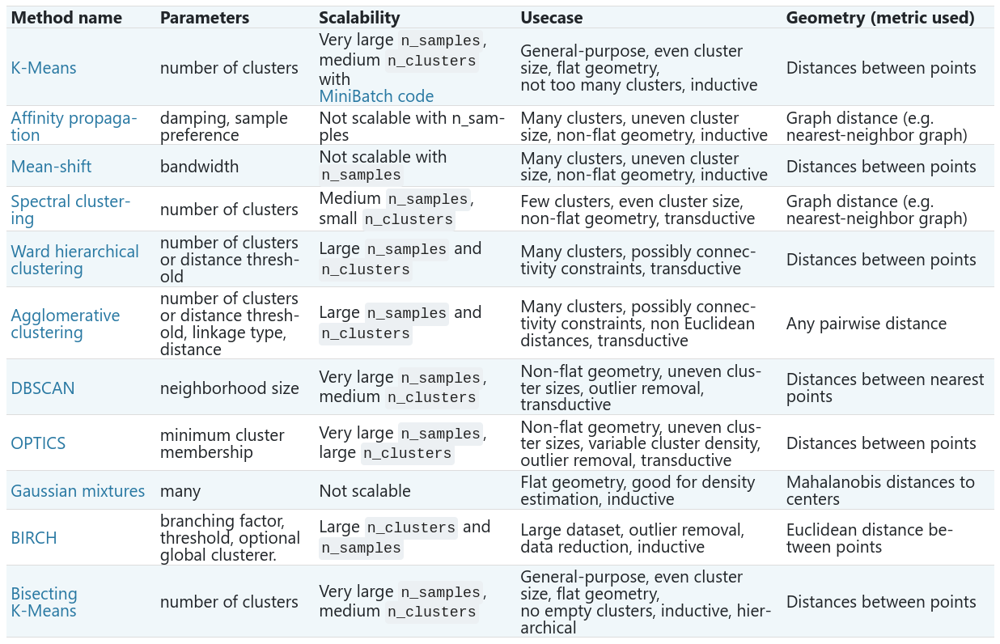

# **K-means**

Алгоритм KMeans группирует данные, пытаясь разделить выборки на n групп с одинаковой дисперсией, сводя к минимуму критерий, известный как инерция или сумма квадратов внутри кластера (см. ниже). Этот алгоритм требует указания количества кластеров. Он хорошо масштабируется для большого количества образцов и используется в самых разных областях применения. 

**Пример.** Кластеризация временных рядов для определения нетипичных периодов, кластеризация транзакций для определения нетипичных транзакций, кластеризация клиентов для определения похожих подгрупп покупателей.

Алгоритм к-средних разделяет набор $X$ из $N$ прецедентов на $K$ непересекающихся кластеров $C$, каждый из которых описывается вектором средних значений признаков $\mu_j$ тех записей, которые относятся к каждому кластеру. Векторы средних значений кластеров называются **центроидами**. Важно, что центроиды не являются записями из выборки $X$, а обладают своими значениями с тем же набором признаков. 

Метод К-средних преследует задачу выбрать центроиды таким образом, чтобы минимизировать общую **инерцию**, или сумму квадратов расстояний точек кластера до точки центроида:

$$\sum_{i=0}^{n}\min_{\mu_j \in C}(||x_i - \mu_j||^2)$$


Инерция предполагает, что кластеры выпуклы и изотропны, что не всегда так. Он плохо реагирует на удлиненные скопления или скопления точек неправильной формы (вогнутые формы скоплений).

Инерция не является нормализованной метрикой: мы просто знаем, что более низкие значения лучше, а ноль оптимален. Но в очень многомерных пространствах евклидовы расстояния имеют тенденцию к завышению (это пример так называемого «проклятия размерности»). Запуск алгоритма уменьшения размерности, такого как анализ главных компонентов (PCA), перед кластеризацией k-средних может облегчить эту проблему и ускорить вычисления.

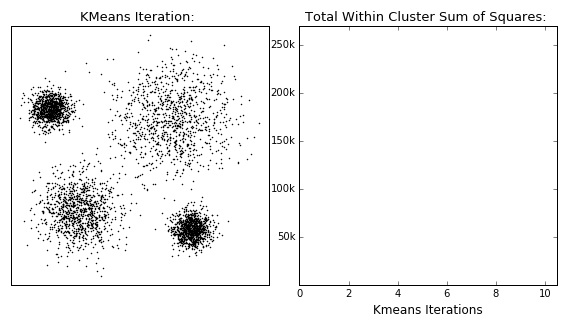

K-средних часто называют алгоритмом Ллойда. В общих чертах алгоритм состоит из трех шагов. 

1. На первом этапе выбираются начальные центроиды, при этом самый простой метод заключается в выборе $k$ выборок из набора данных $X$.

2. После инициализации K-means состоит из цикла между двумя другими шагами. 

- Первый шаг назначает каждому образцу его ближайший центроид. 

- Второй шаг создает новые центроиды, беря среднее значение всех выборок, присвоенных каждому предыдущему центроиду. 

- Вычисляется разница между старым и новым центроидами, и алгоритм повторяет эти последние два шага до тех пор, пока это значение не станет меньше порогового значения. 

3. Другими словами, это повторяется до тех пор, пока центроиды не переместятся значительно.

K-means эквивалентен алгоритму максимизации ожидания с небольшой, равной, диагональной ковариационной матрицей.

При достаточном количестве времени K-средние всегда будут сходиться, однако сходимость часто может приводить к локальному минимуму. Это сильно зависит от инициализации центроидов. В результате вычисление часто выполняется несколько раз с разными инициализациями центроидов. 

Лучшей схемой инициализации центроидов является генерация их на удалении их друг от друга и от данных на окружности вокруг выборки (init = 'k-means++' в scikit-learn). 

# **Affinity propagation**

https://www.geeksforgeeks.org/affinity-propagation-in-ml-to-find-the-number-of-clusters/

AffinityPropagation создает кластеры, отправляя сообщения между парами выборок до сходимости. Затем набор данных описывается с использованием небольшого количества образцов, которые идентифицируются как наиболее репрезентативные для других образцов. 

Сообщения, отправляемые между парами, представляют пригодность одного образца для использования в качестве образца другого, который обновляется в ответ на значения из других пар. Это обновление происходит итеративно до сходимости, после чего выбираются окончательные экземпляры и, следовательно, дается окончательная кластеризация.

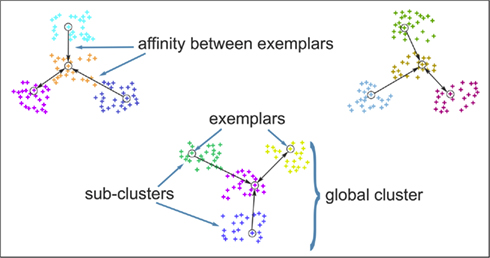

Affinity Propagation может быть интересным, поскольку он выбирает количество кластеров на основе предоставленных данных. Для этой цели двумя важными параметрами являются предпочтение (preferens), которое контролирует количество используемых экземпляров, и коэффициент демпфирования (damping factor), который сглаживает сообщения об ответственности и доступности, чтобы избежать осцилляций численных методов при обновлении этих сообщений.

Основным недостатком Affinity Propagation является его сложность. Алгоритм имеет временную сложность порядка $O(N^2 T)$, где $N$ количество прецедентов или записей в выборке, и $T$ количество итераций до сходимости метода. Кроме того, сложность памяти имеет порядок $O(N^2)$, если используется плотная матрица подобия, но приводима к $O(N)$, если используется разреженная матрица подобия. Это делает Affinity Propagation наиболее подходящим для небольших и средних наборов данных.

Описание алгоритма: Сообщения, отправляемые между точками, относятся к одной из двух категорий. 

- Во-первых, это ответственность $r(i,k)$, которая является накопленным доказательством того, что экземпляр $k$ должен быть образцом для экземпляра $i$. 

- Во-вторых, доступность $a(i, k)$, которая является накопленным свидетельством того, что экземпляр $i$ должен выбрать экземпляр $k$ в качестве своего образца, и учитывает значения для всех других экземпляров, что $k$ должен быть образцом. 

Таким образом, образцы выбираются выборками, если они (1) достаточно похожи на многие экземпляры и (2) выбраны многими экземлярами, чтобы быть репрезентативными сами по себе.

Более формально ответственность экземпляра $k$ за то, что он является образцом экземпляра $i$, определяется следующим образом:

$$r(i, k) \leftarrow s(i, k) - max [ a(i, k') + s(i, k'), \forall k' \neq k ]$$

Где $s(i,k)$ — сходство экземпляров $i$ и $k$. Доступность $k$ в качестве образца экземпляра $i$ определяется выражением:

$$a(i, k) \leftarrow min [0, r(k, k) + \sum_{i'~s.t.~i' \notin \{i, k\}}{r(i', k)}]$$

Для начала все значения для $r$ и $a$ устанавливаются равными нулю, и вычисление каждого повторяется до сходимости. Как обсуждалось выше, во избежание числовых колебаний при обновлении сообщений в итерационный процесс вводится коэффициент демпфирования $\lambda$:

$$r_{t+1}(i, k) = \lambda\cdot r_{t}(i, k) + (1-\lambda)\cdot r_{t+1}(i, k)$$

$$a_{t+1}(i, k) = \lambda\cdot a_{t}(i, k) + (1-\lambda)\cdot a_{t+1}(i, k)$$

где $t$ указывает на количество итераций.


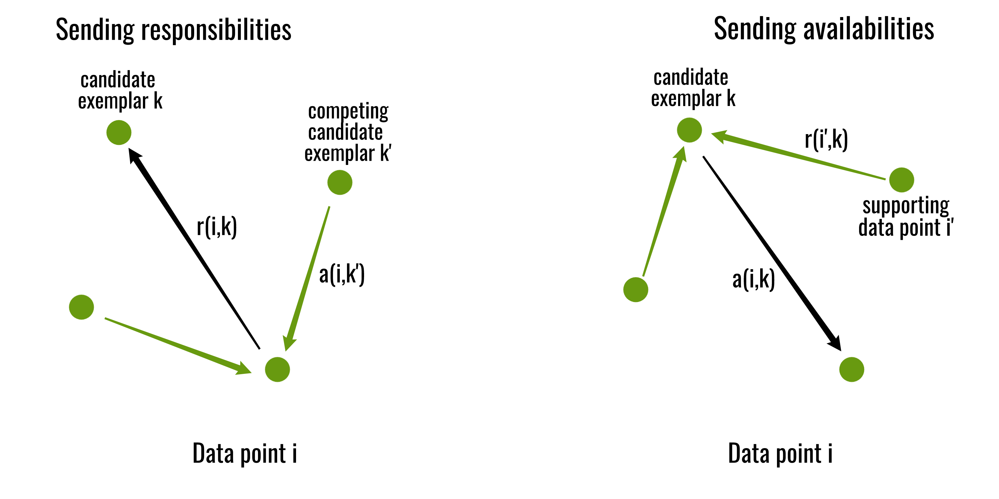

# **Mean shift**

Кластеризация MeanShift направлена ​​​​на обнаружение скоплений объектов в равномерной плотности выборок. Это алгоритм, основанный на центроидах, который работает путем обновления кандидатов на центроиды, чтобы они были средним значением точек в заданной области. Затем эти кандидаты фильтруются на этапе постобработки, чтобы исключить почти дубликаты и сформировать окончательный набор центроидов.

Учитывая центроид-кандидат $x_i$ для итерации $t$, кандидат обновляется в соответствии со следующим уравнением:

$$x_i^{t+1} = m(x_i^t)$$

где $N(x_i)$ — окрестность выборок на заданном расстоянии вокруг $x_i$, а $m$ — вектор среднего сдвига, вычисляемый для каждого центроида, который указывает на область максимального увеличения плотности точек. Это вычисляется с использованием следующего уравнения, эффективно обновляющего центроид, чтобы он был средним значением выборок в его окрестности:


$$m(x_i) = \frac{\sum_{x_j \in N(x_i)}K(x_j - x_i)x_j}{\sum_{x_j \in N(x_i)}K(x_j - x_i)}$$

Алгоритм автоматически устанавливает количество кластеров, вместо того чтобы полагаться на параметр пропускной способности, который определяет размер области для поиска. Этот параметр можно задать вручную, а можно оценить с помощью предоставленной функции Assessment_bandwidth, которая вызывается, если пропускная способность не задана.

Алгоритм не обладает высокой масштабируемостью, так как требует многократного поиска ближайших соседей во время выполнения алгоритма. Алгоритм гарантированно сходится, однако алгоритм прекратит итерацию, когда изменение центроидов будет небольшим.

Маркировка нового образца выполняется путем нахождения ближайшего центроида для данного образца.

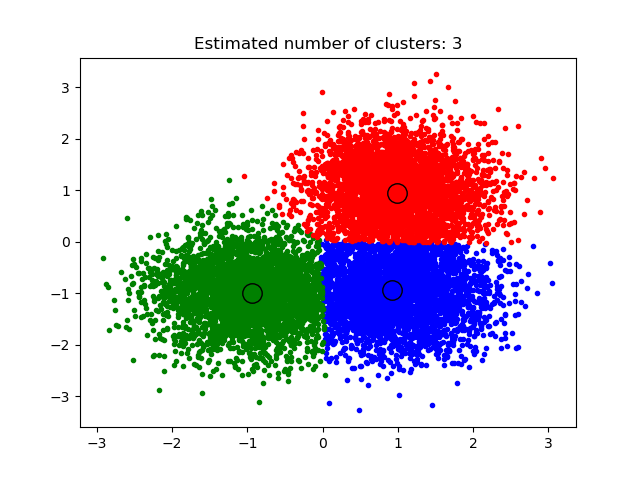

In [3]:
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.cluster import AffinityPropagation
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import Birch
from sklearn.cluster import DBSCAN
from sklearn.cluster import FeatureAgglomeration
from sklearn.cluster import MeanShift
from sklearn.cluster import OPTICS
from sklearn.cluster import SpectralBiclustering, SpectralClustering, SpectralCoclustering

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage.io import imread

# **Учебная задача**

In [3]:
df = pd.read_csv("https://raw.githubusercontent.com/qwerty29544/PY_ML_MIREA_course_2022_2023/main/data/boxes3.csv")

In [4]:
df.head()

,x,y,color
0,400.806675,174.702750,6
1,401.154038,70.450386,0
2,294.722093,30.296820,4
3,415.366580,86.633522,0
4,181.464244,83.254630,1


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21600 entries, 0 to 21599
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   x       21600 non-null  float64
 1   y       21600 non-null  float64
 2   color   21600 non-null  int64  
dtypes: float64(2), int64(1)
memory usage: 506.4 KB


In [6]:
df.shape

(21600, 3)

Text(0.5, 1.0, 'Boxes2')

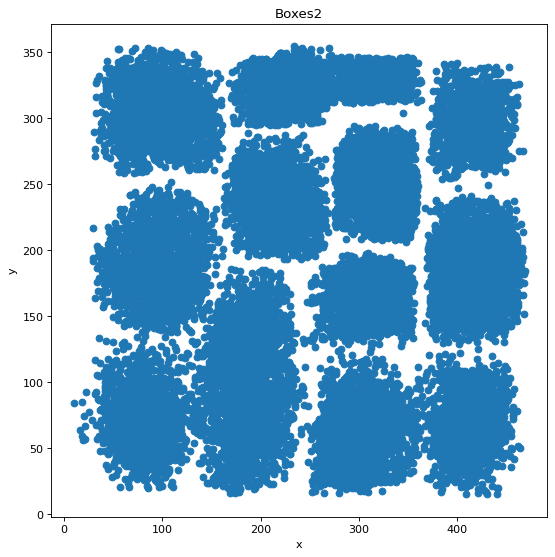

In [7]:
plt.figure(figsize = (8, 8), dpi = 80)
plt.scatter(df['x'], df['y'])
plt.xlabel("x")
plt.ylabel("y")
plt.title("Boxes2")

In [8]:
df.iloc[:, :2]

,x,y
0,400.806675,174.702750
1,401.154038,70.450386
2,294.722093,30.296820
3,415.366580,86.633522
4,181.464244,83.254630
...,...,...
21595,113.964852,277.039448
21596,106.399480,309.584873
21597,297.364281,260.572759
21598,216.247407,268.939725


## **Kmeans**

In [9]:
kmeans_model = KMeans(3)
kmeans_model.fit(X = df.iloc[:, :2])
preds_clusters = kmeans_model.predict(df.iloc[:, :2])
preds_clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


array([1, 1, 1, ..., 2, 2, 0], dtype=int32)

Text(0.5, 1.0, 'Boxes2')

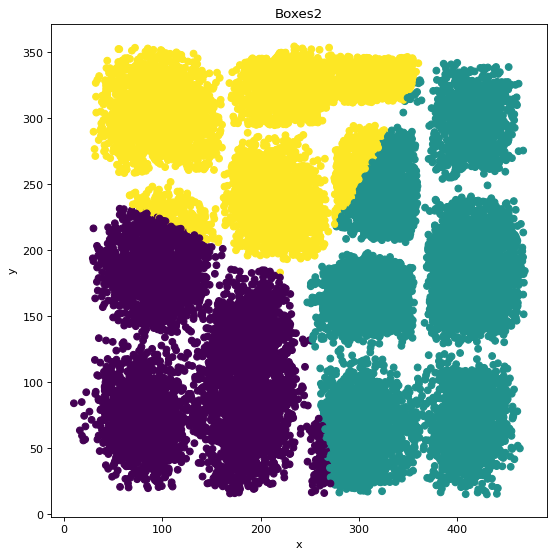

In [10]:
plt.figure(figsize = (8, 8), dpi = 80)
plt.scatter(df['x'], df['y'], c = preds_clusters)
plt.xlabel("x")
plt.ylabel("y")
plt.title("Boxes2")

In [11]:
kmeans_model = KMeans(n_clusters = 3, init = np.array([[100, 300], [200, 400], [250, 450]]))
kmeans_model.fit(X = df.iloc[:, :2])
preds_clusters = kmeans_model.predict(df.iloc[:, :2])
preds_clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1362: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  super()._check_params_vs_input(X, default_n_init=10)


array([1, 1, 1, ..., 2, 2, 0], dtype=int32)

Text(0.5, 1.0, 'Boxes2')

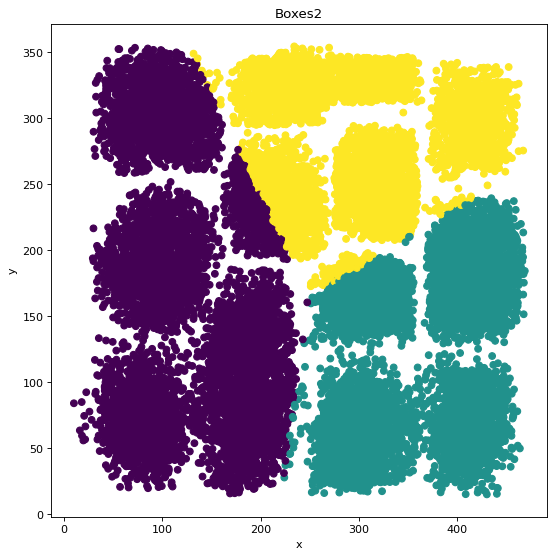

In [12]:
plt.figure(figsize = (8, 8), dpi = 80)
plt.scatter(df['x'], df['y'], c = preds_clusters)
plt.xlabel("x")
plt.ylabel("y")
plt.title("Boxes2")

## **AffinityProp**

In [ ]:
Affinity_model = AffinityPropagation()
Affinity_model.fit(df.iloc[:, :2])
preds_affinity = Affinity_model.predict(df.iloc[:, :2])
preds_affinity

In [ ]:
plt.figure(figsize = (8, 8), dpi = 80)
plt.scatter(df['x'], df['y'], c = preds_affinity)
plt.xlabel("x")
plt.ylabel("y")
plt.title("Boxes2")

## **DBSCAN**

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df.iloc[:, :2])

In [ ]:
DB_model = DBSCAN(eps=0.1, min_samples=1)
DB_model.fit(df_scaled)
DB_model.labels_

In [ ]:
true_vals = df["color"].replace([1, 0],[0, 1])

In [ ]:
np.sum(true_vals == DB_model.labels_) / len(df)

In [ ]:
plt.figure(figsize = (8, 8), dpi = 80)
plt.scatter(df_scaled[:, 0], df_scaled[:, 1], c = DB_model.labels_)
plt.xlabel("x")
plt.ylabel("y")
plt.title("Boxes2")

# **Кластеризация цветов изображений**

In [4]:
shrek = imread("https://images.kinorium.com/movie/shot/237554/w1500_41583623.jpg")

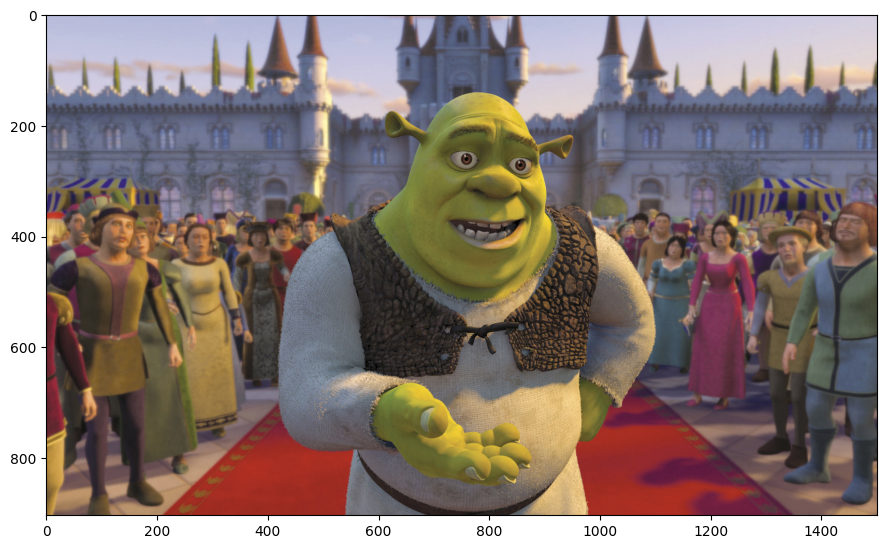

In [5]:
plt.figure(figsize=(12, 6.5))
plt.imshow(shrek)

In [6]:
shrek.shape

(904, 1500, 3)

In [7]:
flat_shrek = shrek.reshape(shrek.shape[0] * shrek.shape[1], shrek.shape[2]) / 255

In [8]:
def plot_pixels(data, title, colors=None, N=10000):
    if colors is None:
        colors = data
    
    # choose a random subset
    rng = np.random.RandomState(0)
    i = rng.permutation(data.shape[0])[:N]
    colors = colors[i]
    R, G, B = data[i].T
    
    fig, ax = plt.subplots(1, 2, figsize=(16, 6))
    ax[0].scatter(R, G, c=colors, marker='.')
    ax[0].set(xlabel='Red', ylabel='Green', xlim=(0, 1), ylim=(0, 1))

    ax[1].scatter(R, B, c=colors, marker='.')
    ax[1].set(xlabel='Red', ylabel='Blue', xlim=(0, 1), ylim=(0, 1))

    fig.suptitle(title, size=20);

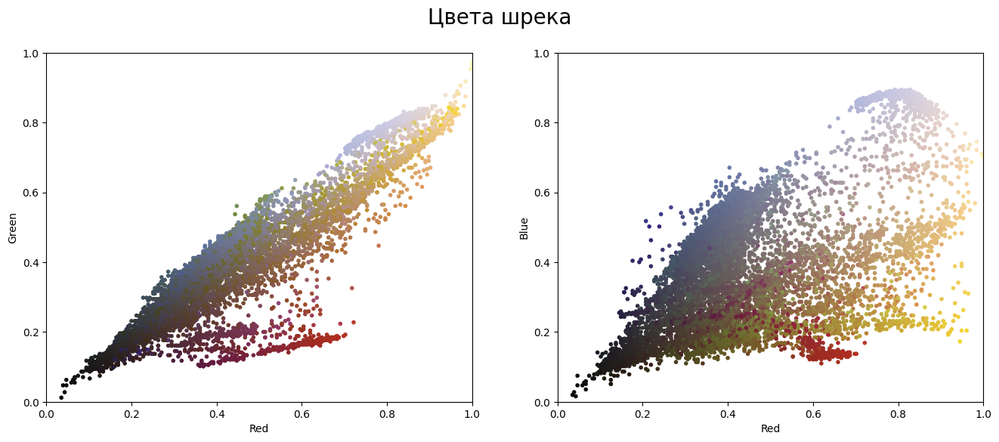

In [9]:
plot_pixels(flat_shrek, title="Цвета шрека")

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


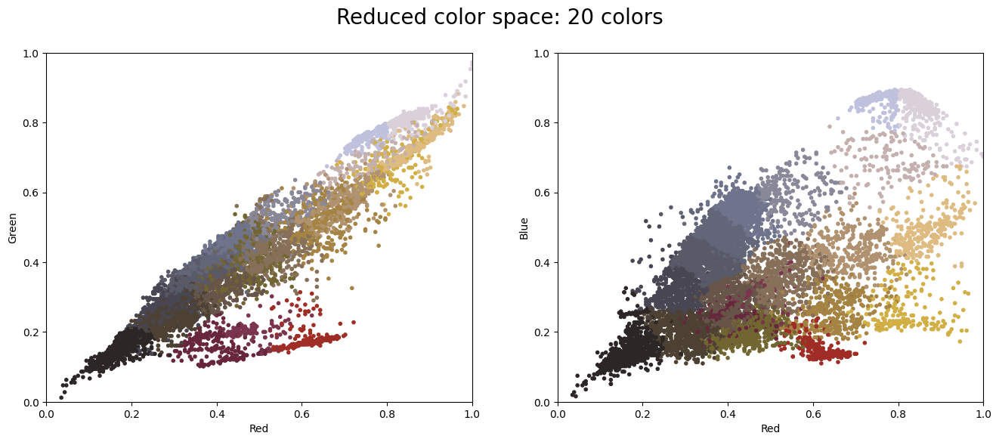

In [10]:
kmeans = MiniBatchKMeans(20)
kmeans.fit(flat_shrek)
new_colors = kmeans.cluster_centers_[kmeans.predict(flat_shrek)]

plot_pixels(flat_shrek, colors=new_colors,
            title="Reduced color space: 20 colors")

Text(0.5, 1.0, '20-color Image')

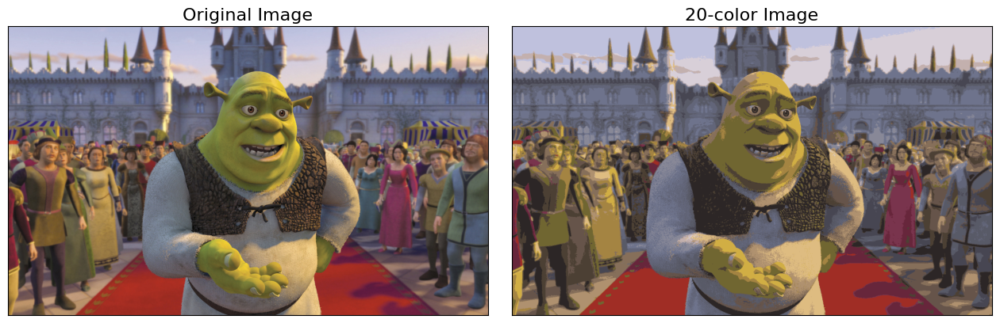

In [11]:
shrek_recolored = new_colors.reshape(shrek.shape)

fig, ax = plt.subplots(1, 2, figsize=(16, 6),
                       subplot_kw=dict(xticks=[], yticks=[]))
fig.subplots_adjust(wspace=0.05)
ax[0].imshow(shrek)
ax[0].set_title('Original Image', size=16)
ax[1].imshow(shrek_recolored)
ax[1].set_title('20-color Image', size=16)

Подсчет общей внутрикластерной суммы по кластерам от 1 до 20

In [12]:
n_colors = 100
inertia_list = []

for n_clusters in range(2, n_colors + 1):
    kmeans_l = MiniBatchKMeans(n_clusters)
    kmeans_l.fit(flat_shrek)
    inertia_list.append(kmeans_l.inertia_)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: 

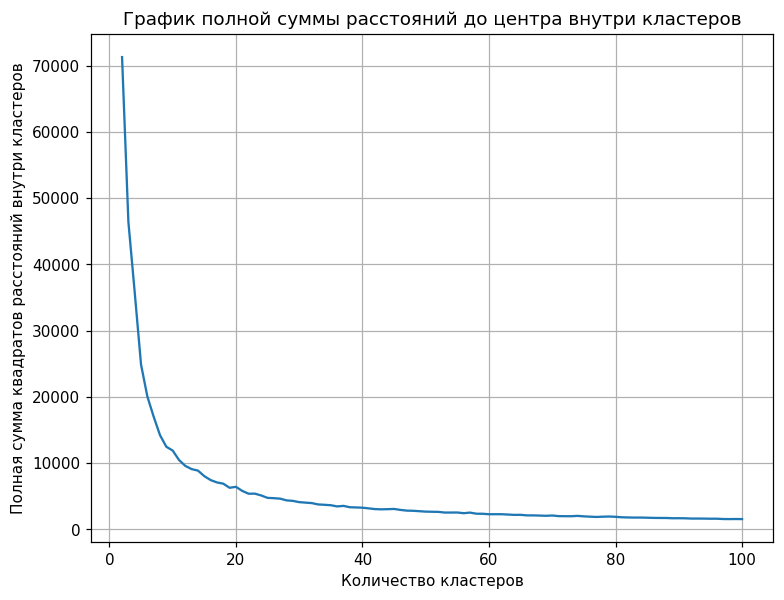

In [13]:
plt.figure(figsize = (8, 6), dpi = 110)
plt.plot(range(2, n_colors + 1), inertia_list)
plt.grid()
plt.title("График полной суммы расстояний до центра внутри кластеров")
plt.xlabel("Количество кластеров")
plt.ylabel("Полная сумма квадратов расстояний внутри кластеров")
plt.show()

# **Задание №1.**

Вариант №1. https://raw.githubusercontent.com/qwerty29544/PY_ML_MIREA_course_2022_2023/main/data/wave.csv

Вариант №2. https://raw.githubusercontent.com/qwerty29544/PY_ML_MIREA_course_2022_2023/main/data/boxes3.csv

Вариант №3. https://raw.githubusercontent.com/qwerty29544/PY_ML_MIREA_course_2022_2023/main/data/chrome.csv

Вариант №4. https://raw.githubusercontent.com/qwerty29544/PY_ML_MIREA_course_2022_2023/main/data/dart2.csv

Вариант №5. https://raw.githubusercontent.com/qwerty29544/PY_ML_MIREA_course_2022_2023/main/data/face.csv

Вариант №6. https://raw.githubusercontent.com/qwerty29544/PY_ML_MIREA_course_2022_2023/main/data/face.csv

Вариант №7. https://raw.githubusercontent.com/qwerty29544/PY_ML_MIREA_course_2022_2023/main/data/isolation.csv

Вариант №8. https://raw.githubusercontent.com/qwerty29544/PY_ML_MIREA_course_2022_2023/main/data/lines.csv

Вариант №9. https://raw.githubusercontent.com/qwerty29544/PY_ML_MIREA_course_2022_2023/main/data/lines2.csv

Вариант №10. https://raw.githubusercontent.com/qwerty29544/PY_ML_MIREA_course_2022_2023/main/data/network.csv

Вариант №11. https://raw.githubusercontent.com/qwerty29544/PY_ML_MIREA_course_2022_2023/main/data/spiral2.csv

Вариант №12. https://raw.githubusercontent.com/qwerty29544/PY_ML_MIREA_course_2022_2023/main/data/spirals.csv

Вариант №13. https://raw.githubusercontent.com/qwerty29544/PY_ML_MIREA_course_2022_2023/main/data/triangle.csv

Вариант №14. https://raw.githubusercontent.com/qwerty29544/PY_ML_MIREA_course_2022_2023/main/data/un2.csv


1. Выбрать 3 алгоритма кластеризации на выбор для решения поставленной задачи. Один из алгоритмов кластеризации обязательно должен быть вне списка рассмотренных ранее алгоритмов. Для данного метода необходимо привести его теорию для объяснения способа и идеи его работы.

2. Выбрать набор данных исходя из варианта задания.

3. По полученной выборке построить модель кластеризации данных на основе выбранных алгоритмов кластеризации. 

- Построить модели для $k = 2, 3, 4, \dots, 10$ кластеров, если данный параметр имеет место быть в определении методов. +

- Построить график суммы расстояний прецедентов внутри выборки до центра кластеров, по принципу **локтя оценить оптимальное количество кластеров**.

4. Для полученной модели кластеризации сравнить результаты с априорными данными **color** по функции точности восстановления классов (количество верных совпадений).

- Для реализации метрики, скорее всего придется задавать начальное состояние класетризации, или переопределить метки классов методом **pd.replace()**.

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
df = pd.read_csv("https://raw.githubusercontent.com/qwerty29544/PY_ML_MIREA_course_2022_2023/main/data/boxes3.csv")

In [15]:
df

,x,y,color
0,400.806675,174.702750,6
1,401.154038,70.450386,0
2,294.722093,30.296820,4
3,415.366580,86.633522,0
4,181.464244,83.254630,1
...,...,...,...
21595,113.964852,277.039448,5
21596,106.399480,309.584873,5
21597,297.364281,260.572759,7
21598,216.247407,268.939725,8


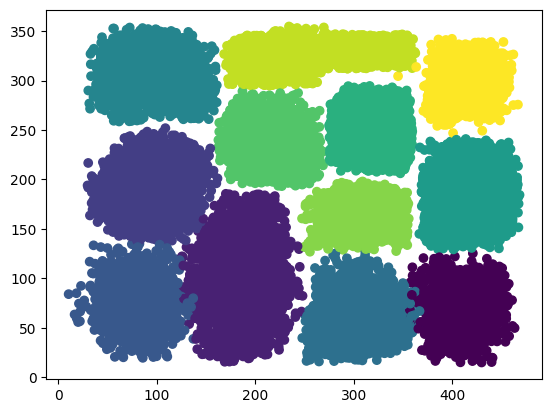

In [16]:
plt.scatter(df['x'], df['y'], c = df['color'])

Гауссова смесь распределений — статистическая модель для представления нормально распределенных субпопуляций внутри общей популяции. Гауссова смесь распределений параметризируется двумя типами значений — смесь весов компонентов и средних компонентов или ковариаций (для многомерного случая). 

Гауссова смесьэто функция, которая состоит из нескольких гауссиан, каждый из которых определяетсяК∈ {1,…,К}, гдеКэто количество кластеров нашего набора данных. Каждый гауссКВ состав смеси входят следующие параметры:

1. Среднее значение μ, определяющее его центр.
2. Ковариация Σ, которая определяет его ширину. Это было бы эквивалентно размерам эллипсоида в многомерном сценарии.
3. Вероятность смешивания π, которая определяет, насколько большой или малой будет функция Гаусса. 

![](https://machinelearningmastery.ru/img/0-966800-213214.png)

In [17]:
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score

In [18]:
for n_clusters in range(2, 11):
  gmm_model = GaussianMixture(n_components=n_clusters)
  gmm_model.fit(df)
  cluster_labels = gmm_model.predict(df)
  score = silhouette_score(df, cluster_labels)
  print(f'k = {n_clusters}: {score}')

k = 2: 0.3480413385817538
k = 3: 0.3584090690385118
k = 4: 0.3129564040943522
k = 5: 0.33543619138721675
k = 6: 0.40988194240519704
k = 7: 0.37041128607850077
k = 8: 0.40317448801371536
k = 9: 0.4538985553755336
k = 10: 0.43670333390937127


In [19]:
  gmm_model = GaussianMixture(n_components=6)
  gmm_model.fit(df)
  cluster_labels = gmm_model.predict(df)

In [20]:
model = KMeans(n_clusters=6)
pred = model.fit_predict(df)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


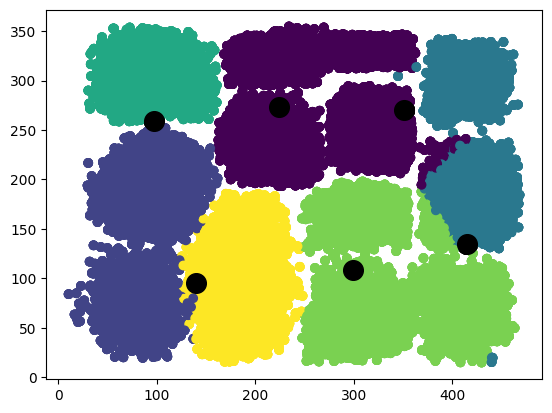

In [21]:
for k in range(0,5):
    plt.scatter(df['x'], df['y'], c=cluster_labels)
    plt.scatter(model.cluster_centers_[:, 0], model.cluster_centers_[:, 1], s = 200, c = 'black')

In [22]:
model.cluster_centers_

array([[299.7560588 , 108.10957331,   6.00720022],
       [139.57680833,  95.75717676,   1.78136973],
       [223.85121904, 273.1903537 ,   8.71047041],
       [414.70715978, 134.73245407,   3.61755486],
       [350.72476265, 270.57544189,   8.39927252],
       [ 96.65092741, 259.45190285,   3.72336329]])

In [23]:
from sklearn import metrics
from scipy.spatial.distance import cdist
distortions = []
K = range(2, 11)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(df)
    distortions.append(sum(np.min(cdist(df, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / df.shape[0])

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

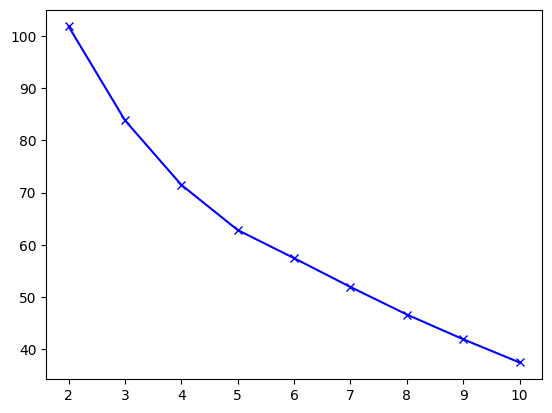

In [24]:
plt.plot(K, distortions, 'bx-')

In [25]:
np.sum(df['color'].replace([1, 0],[0, 1]) == cluster_labels) / len(df)

0.08523148148148148

In [26]:
!pip3 install kneed

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


5.4607173735051315


<Figure size 500x500 with 0 Axes>

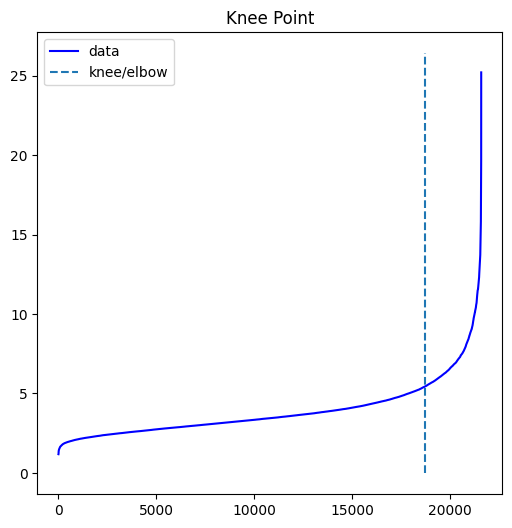

In [27]:
from sklearn.neighbors import NearestNeighbors
from kneed import KneeLocator

nearest_neighbors = NearestNeighbors(n_neighbors=11)
neighbors = nearest_neighbors.fit(df)

distances, indices = neighbors.kneighbors(df)
distances = np.sort(distances[:,10], axis=0)
i = np.arange(len(distances))
knee = KneeLocator(i, distances, S=1, curve='convex', direction='increasing', interp_method='polynomial') 

fig = plt.figure(figsize=(5, 5))
knee.plot_knee()

print(distances[knee.knee])

In [28]:
DB_model = DBSCAN(eps=5.9, min_samples=6).fit(df)

In [29]:
DB_model.labels_

array([0, 1, 2, ..., 4, 5, 3])

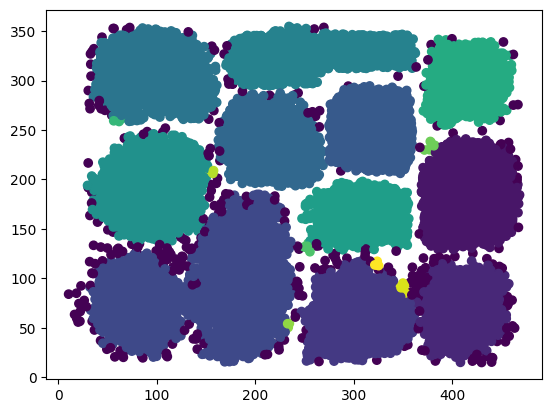

In [30]:
plt.scatter(df['x'], df['y'], c = DB_model.labels_)

In [31]:
np.sum(df['color'] == DB_model.labels_) / len(df)

0.13800925925925925

In [32]:
model = KMeans(n_clusters=6).fit(df) 
preds = model.predict(df)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


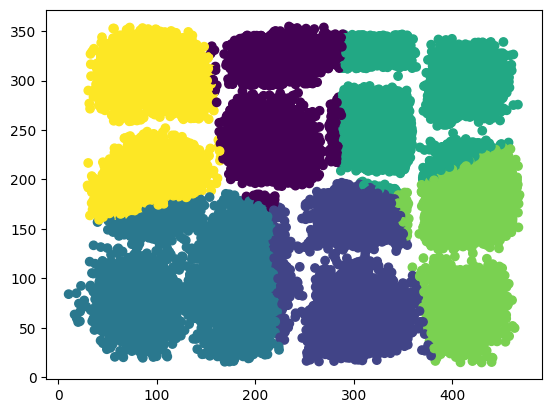

In [33]:
plt.scatter(df['x'], df['y'], c = preds)

# **Задание №2**

1. Выбрать изображение в интернете.

2. Импортировать изображение в рабочую область в качестве переменной

3. На основе 2 алгоритмов с возможностью получения центров кластеров сжать цветовое представление изображения до 10, 20, 40, 60, 80 цветов.

4. Оцените качество сжатия цветовой палитры на каждом из значений гиперпараметра.


In [34]:
bel = imread('https://img2.akspic.ru/attachments/originals/4/4/7/8/3/138744-fenek-hishhnik-psovye-ryzhaya_lisica-morda-4928x3280.jpg')

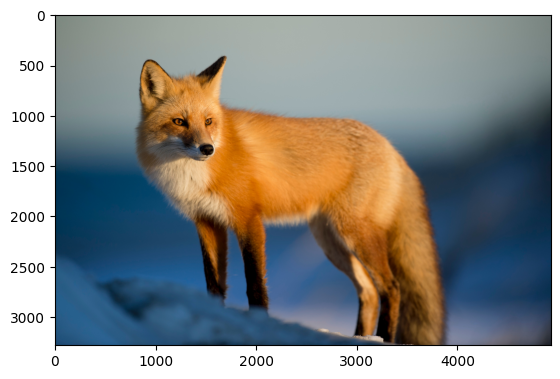

In [35]:
plt.imshow(bel)

In [36]:
flat_bel = bel.reshape(bel.shape[0] * bel.shape[1], bel.shape[2]) / 255

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: 

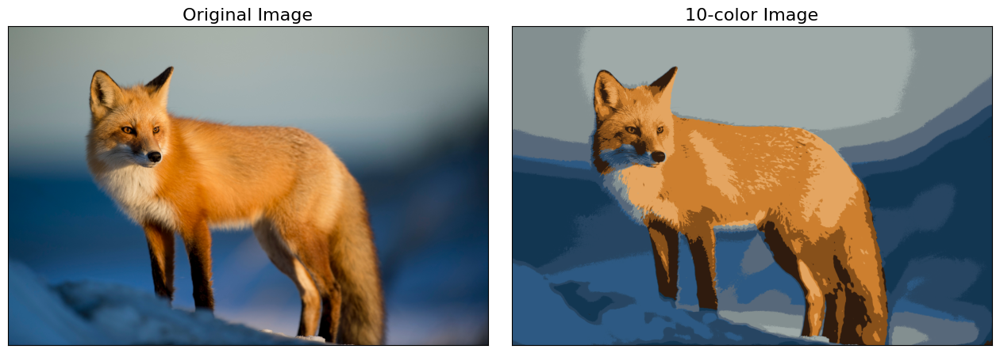

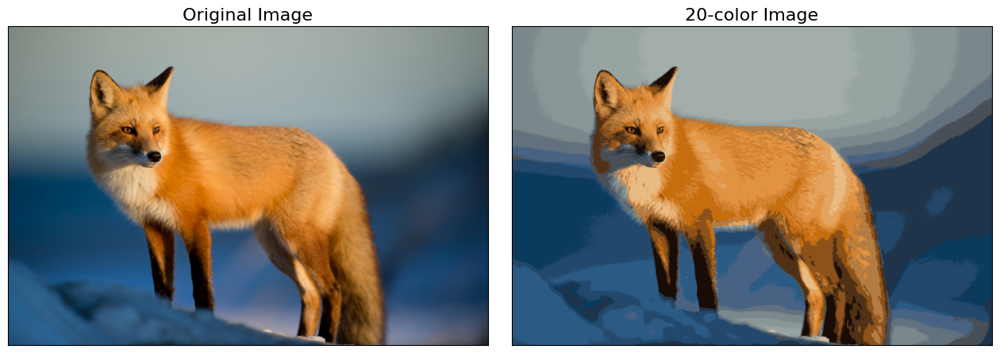

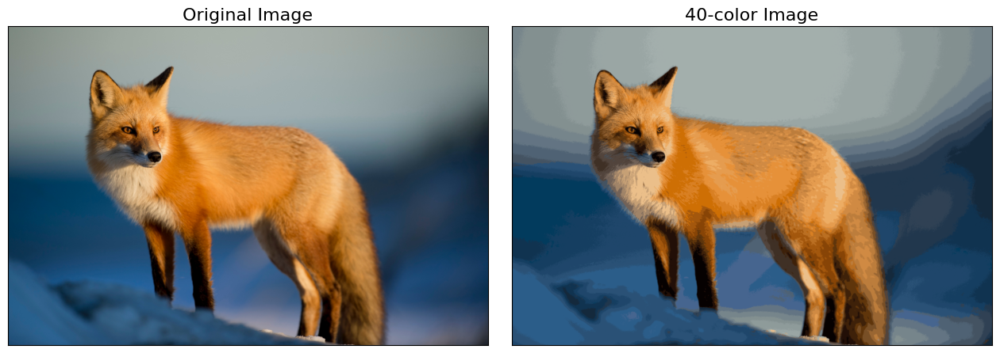

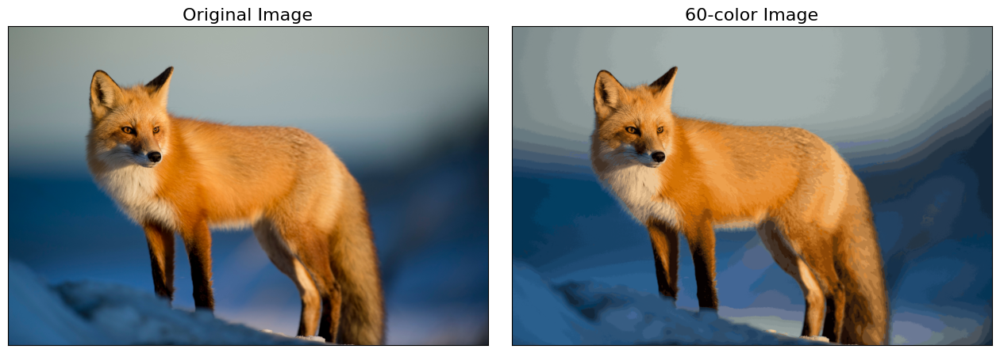

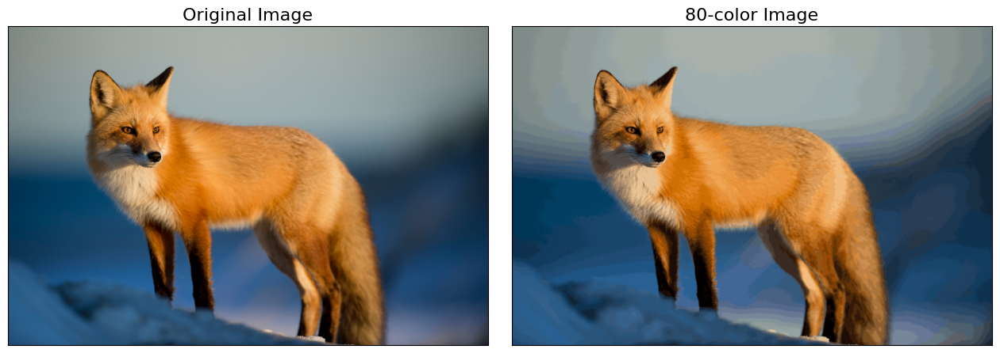

In [37]:
col = [10, 20, 40, 60, 80]
for i in col:  
  kmeans = MiniBatchKMeans(i)
  kmeans.fit(flat_bel)
  new_colors = kmeans.cluster_centers_[kmeans.predict(flat_bel)]
  bel_recolored = new_colors.reshape(bel.shape)
  fig, ax = plt.subplots(1, 2, figsize=(16, 6),
                        subplot_kw=dict(xticks=[], yticks=[]))
  fig.subplots_adjust(wspace=0.05)
  ax[0].imshow(bel)
  ax[0].set_title('Original Image', size=16)
  ax[1].imshow(bel_recolored)
  ax[1].set_title(f'{i}-color Image', size=16)

In [38]:
n_colors = 80
inertia_list = []

for n_clusters in range(2, n_colors + 1):
    kmeans_l = MiniBatchKMeans(n_clusters)
    kmeans_l.fit(flat_bel)
    inertia_list.append(kmeans_l.inertia_)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: 

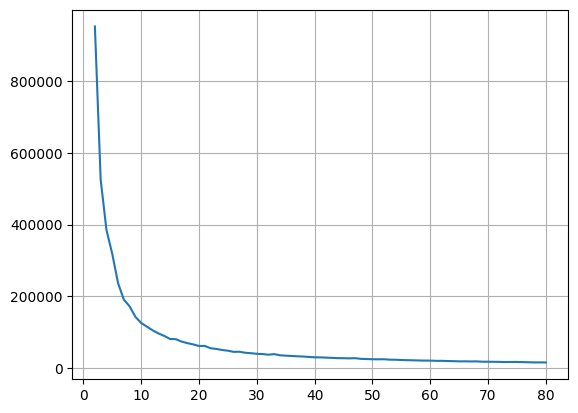

In [39]:
plt.plot(range(2, n_colors + 1), inertia_list)
plt.grid()
plt.show()

In [40]:
from sklearn.decomposition import PCA
import cv2
from scipy.stats import stats
import matplotlib.image as mpimg

In [41]:
blue,green,red = cv2.split(bel)
green_temp_df = pd.DataFrame(data = green)
blue_temp_df = pd.DataFrame(data = blue)
red_temp_df = pd.DataFrame(data = red)

In [42]:
df_blue = blue/255
df_green = green/255
df_red = red/255

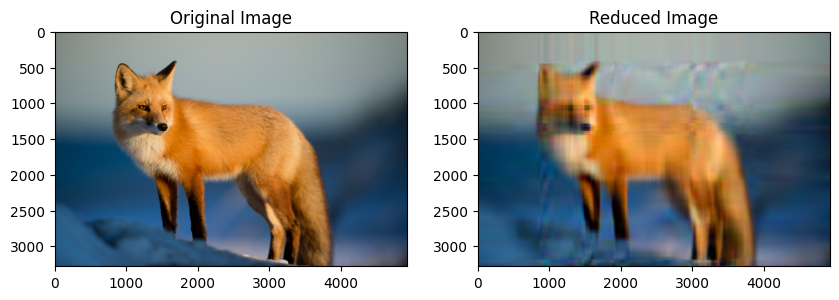

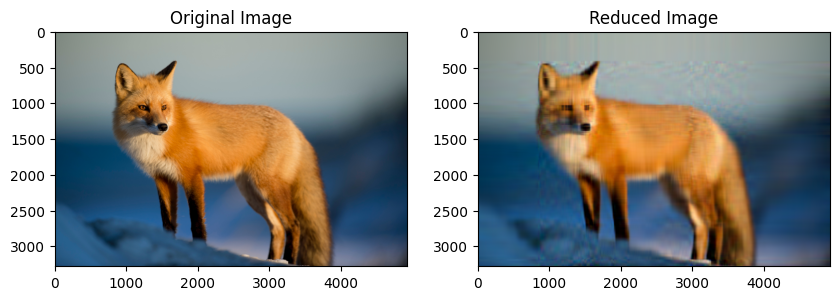

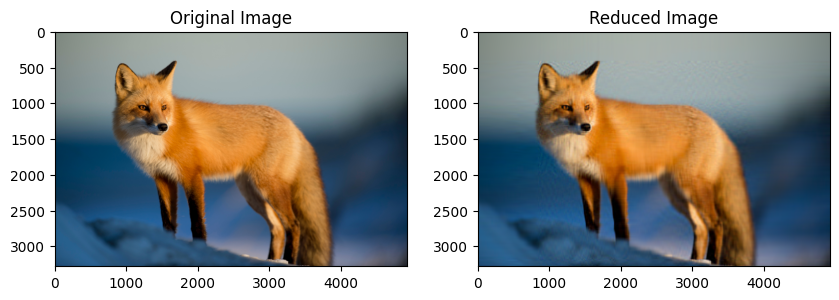

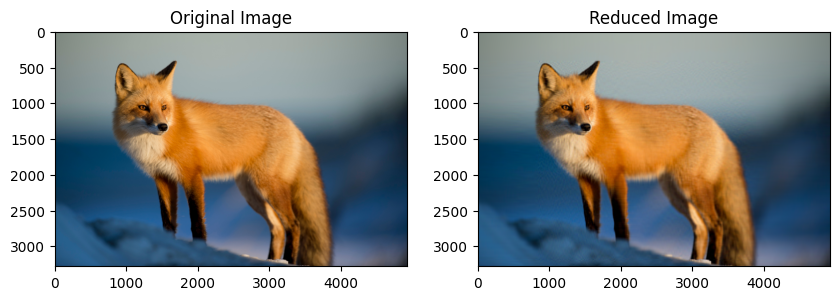

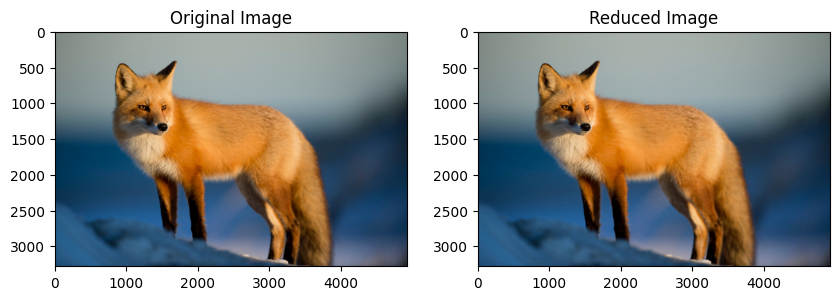

In [43]:
col = [10, 20, 40, 60, 80]
for i in col:
  pca_b = PCA(n_components=i)
  pca_b.fit(df_blue)
  trans_pca_b = pca_b.transform(df_blue)
  pca_g = PCA(n_components=i)
  pca_g.fit(df_green)
  trans_pca_g = pca_g.transform(df_green)
  pca_r = PCA(n_components=i)
  pca_r.fit(df_red)
  trans_pca_r = pca_r.transform(df_red)
  b_arr = pca_b.inverse_transform(trans_pca_b)
  g_arr = pca_g.inverse_transform(trans_pca_g)
  r_arr = pca_r.inverse_transform(trans_pca_r)
  img_reduced= (cv2.merge((b_arr, g_arr, r_arr))) 
  fig = plt.figure(figsize = (10, 7.2)) 
  fig.add_subplot(121)
  plt.title("Original Image")
  plt.imshow(bel)
  fig.add_subplot(122)
  plt.title("Reduced Image")
  plt.imshow(img_reduced)
  plt.show()